<p align="center">
  <img src="Cognifyz.png" alt="Your Image Description" />
</p>


#

## Level -1

In [2]:
# importing required libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import warnings
warnings.filterwarnings('ignore')
from sklearn.cluster import KMeans
import folium
from folium.plugins import MarkerCluster

In [3]:
#reading the datset
df = pd.read_csv('Dataset .csv')
df.head(2)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591


In [4]:
# Data set basic Understanding 

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [5]:
#checking rows and columns
df.shape

(9551, 21)

In [6]:
#checking nulls
df.isna().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

In [7]:
#checking duplicates
df[df.duplicated()]

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes


#### The dataset seems to be clean and ready for performing the assigned tasks .... Lets begin...

## Task-1

<p align="center">
  <img src="Level-2 T-1.png" alt="Your Image Description" />
</p>


#

### 1. Analyze the distribution of aggregate ratings and determine the most common rating range.

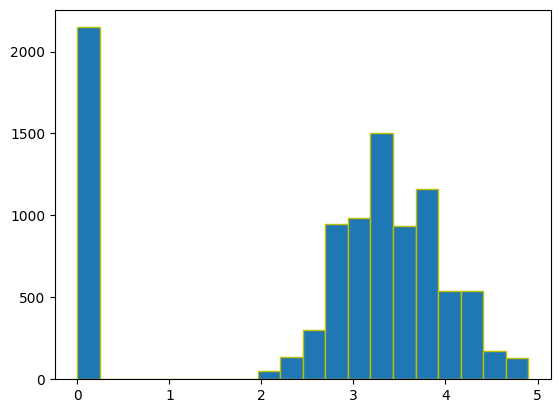

In [8]:
plt.hist(df['Aggregate rating'], bins=20 ,edgecolor='y')
plt.show()

### Observation

- The distribution of Aggregate rating lies in the range from 2 - 5.
- The most common rating range is 0.

### 2. Calculate the average number of votes received by restaurants.

In [9]:
# Calculate the average number of votes
average_votes = df['Votes'].mean()

# Print the result
print(f"The average number of votes received by restaurants is: {average_votes:.2f}")


The average number of votes received by restaurants is: 156.91


In [10]:
per_rest = df.groupby('Restaurant Name')
per_rest['Votes'].mean().sort_values(ascending=False)

Restaurant Name
Toit                            10934.0
Hauz Khas Social                 7931.0
Peter Cat                        7574.0
Big Brewsky                      5705.0
The Black Pearl                  5385.0
                                 ...   
Cafe Treat                          0.0
Ralhan Eating Corner                0.0
Raju Vaishno Amritsari Dhaba        0.0
The Golden Spoon                    0.0
Shree Vinayaga Restaurant           0.0
Name: Votes, Length: 7446, dtype: float64

### Observation

- The average number of votes received by restaurants : 156.77.
- The average number of highest votes received by the restaurants is Toit having approx 10934 Votes.
- Some of the restaurant having No rating, like Cafe Treat ,  Ralhan Eating cornerThe golden spoon.

#

#

## Task- 2

<p align="center">
  <img src="Level-2 T-2.png" alt="Your Image Description" />
</p>


#

### 1. Identify the most common combinations of cuisines in the dataset.

In [11]:
# Clean 'Cuisines' column and split it by commas
df['Cuisines'] = df['Cuisines'].fillna('')  # Ensure no NaN values
df['Cuisines'] = df['Cuisines'].apply(lambda x: str(x).split(', '))  # Split cuisines into a list

#  Create a list of all cuisine combinations
all_combinations = []
for cuisines in df['Cuisines']:
    all_combinations.append(tuple(sorted(cuisines)))  # Sorting to handle unordered combinations

#  Count the frequency of each combination
combination_counts = Counter(all_combinations)

#  Convert the result to a DataFrame for easier reading
combination_df = pd.DataFrame(combination_counts.items(), columns=['Cuisines Combination', 'Count'])

#  Sort the combinations by count to find the most common ones
most_common_combinations = combination_df.sort_values(by='Count', ascending=False)

# Display the top 10 most common combinations
most_common_combinations.head(10)


,Cuisines Combination,Count
337,"(North Indian,)",936
370,"(Chinese, North Indian)",616
336,"(Mughlai, North Indian)",394
5,"(Chinese,)",354
62,"(Fast Food,)",354
339,"(Chinese, Mughlai, North Indian)",306
20,"(Cafe,)",299
21,"(Bakery,)",218
452,"(Bakery, Desserts)",181
463,"(Chinese, Fast Food)",159


### Observation:
- The most common combinations of cuisines are 'North Indian, Chinese' having 511 count according to the datasets.

#

### 2. Determine if certain cuisine combinations tend to have higher ratings.

In [12]:
#  'Cuisines' column contains lists, join them into a string with commas
df['Cuisines'] = df['Cuisines'].apply(lambda x: ', '.join(sorted(x)) if isinstance(x, list) else str(x))

#  Clean up any unwanted characters (like extra quotes or brackets)
df['Cuisines'] = df['Cuisines'].str.replace(r"[^\w\s,]", "", regex=True)  # Remove unwanted characters

#  Group by 'Cuisines' and calculate the mean of 'Aggregate rating'
cuisine_comb = df.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=False)

#  Print the cuisines with the highest ratings
print(f'{"Cuisines":<32} {"Rating":<30}')
print("-" * 50)

#  Count and display the combinations with the highest average rating
count = 0
for cuisine, rating in cuisine_comb.items():
    if rating == cuisine_comb.max():
        count += 1
        print(f'{cuisine:<35}{rating:<10}')

#  Output the total number of highest rating combinations
print(f'\nTotal Number of highest combinations: {count}')


Cuisines                         Rating                        
--------------------------------------------------
World Cuisine                      4.9       
Asian, European, Indian            4.9       
American, Caribbean, Seafood       4.9       
American, Coffee and Tea           4.9       
Bar Food, Burger, Steak            4.9       
Contemporary, European             4.9       
Bakery, Continental, Italian       4.9       
American, Healthy Food, Mexican    4.9       
American, BBQ, Sandwich            4.9       
BBQ, Breakfast, Southern           4.9       
American, Sandwich, Tea            4.9       
European, German                   4.9       
Indonesian, Sunda                  4.9       
Deli, Italian                      4.9       
Hawaiian, Seafood                  4.9       

Total Number of highest combinations: 15


### Observation:
- The higest rating is 4.9 .
- The total number of cuisines having higest rating are 18.
- Out of 18 , 17 are consider as a cuisines combination category (excpet World Cuisine).

#

## Task -3

<p align="center">
  <img src="Level-2 T-3.png" alt="Your Image Description" />
</p>


#

### 1. Plot the locations of restaurants on a map using longitude and latitude coordinates.

In [13]:
# we will be using folium 
!pip install folium

In [14]:
import folium

# Create a folium map centered at an arbitrary location
map_center = [df['Latitude'].loc[0], df['Longitude'].iloc[0]]
my_map = folium.Map(location=map_center, zoom_start=12)

# Add markers for each restaurant
for _, restaurant in df.iterrows():
    folium.Marker( location=[restaurant['Latitude'], restaurant['Longitude']],
                  popup=restaurant['Restaurant Name'] ).add_to(my_map)

# Save the map to an HTML file or display it
my_map.save("restaurant_map.html")
my_map  

#

### 2. Identify any patterns or clusters of restaurants in specific areas.

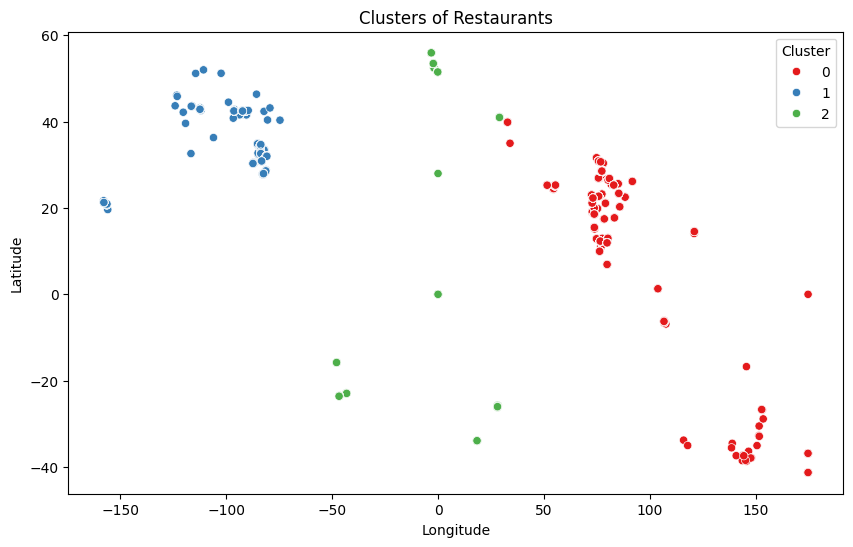

In [15]:

# Drop rows with missing latitudes or longitudes
df_clean = df.dropna(subset=['Latitude', 'Longitude'])

# Selecting the relevant columns
coords = df_clean[['Latitude', 'Longitude']]

# Apply KMeans clustering 
kmeans = KMeans(n_clusters=3, random_state=42)
df_clean['Cluster'] = kmeans.fit_predict(coords)

# Visualize the clusters using a scatter plot
plt.figure(figsize=(10,6))
sns.scatterplot(data=df_clean, x='Longitude', y='Latitude', hue='Cluster', palette='Set1')
plt.title('Clusters of Restaurants')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='Cluster')
plt.show()

#  Map the clusters using Folium
# Create a base map centered around the average coordinates
m = folium.Map(location=[df_clean['Latitude'].mean(), df_clean['Longitude'].mean()], zoom_start=12)

# Add a marker cluster
marker_cluster = MarkerCluster().add_to(m)

# Add restaurant markers with cluster information
for _, row in df_clean.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.6,
        popup=f"Restaurant: {row['Restaurant Name']}, Cluster: {row['Cluster']}"
    ).add_to(marker_cluster)

# Save the map to an HTML file and display it in Jupyter Notebook
m.save('restaurant_clusters_map.html')


#

## Task-4

<p align="center">
  <img src="Level-2 T-4.png" alt="Your Image Description" />
</p>


#

### 1. Identify if there are any restaurant chains present in the dataset.

In [19]:
#  Check for duplicate restaurant names 
restaurant_counts = df['Restaurant Name'].value_counts()

#  Filter out restaurants that appear more than once (indicating they are chains)
restaurant_chains = restaurant_counts[restaurant_counts > 1]

# Display the restaurant chains and their locations
print("Restaurant Chains:")
print(restaurant_chains)




Restaurant Chains:
Restaurant Name
Cafe Coffee Day       83
Domino's Pizza        79
Subway                63
Green Chick Chop      51
McDonald's            48
                      ..
Town Hall              2
Halki Aanch            2
Snack Junction         2
Delhi Biryani Hut      2
Beliram Degchiwala     2
Name: count, Length: 734, dtype: int64


**Total 734 number of restaurant chain are found.**

#

### 2. Analyze the ratings and popularity of different restaurant chains.

In [21]:

#  Identify restaurant chains (restaurants with more than one entry)
restaurant_counts = df['Restaurant Name'].value_counts()
restaurant_chains = restaurant_counts[restaurant_counts > 1]

#  Filter the dataset to include only restaurant chains
restaurant_chain_data = df[df['Restaurant Name'].isin(restaurant_chains.index)]

#  Calculate average rating and total votes for each restaurant chain
chain_ratings = restaurant_chain_data.groupby('Restaurant Name').agg(
    average_rating=('Aggregate rating', 'mean'),
    total_votes=('Votes', 'sum')
).reset_index()

#  Sort the data by average rating and total votes
chain_ratings_sorted_by_rating = chain_ratings.sort_values(by='average_rating', ascending=False)
chain_ratings_sorted_by_votes = chain_ratings.sort_values(by='total_votes', ascending=False)




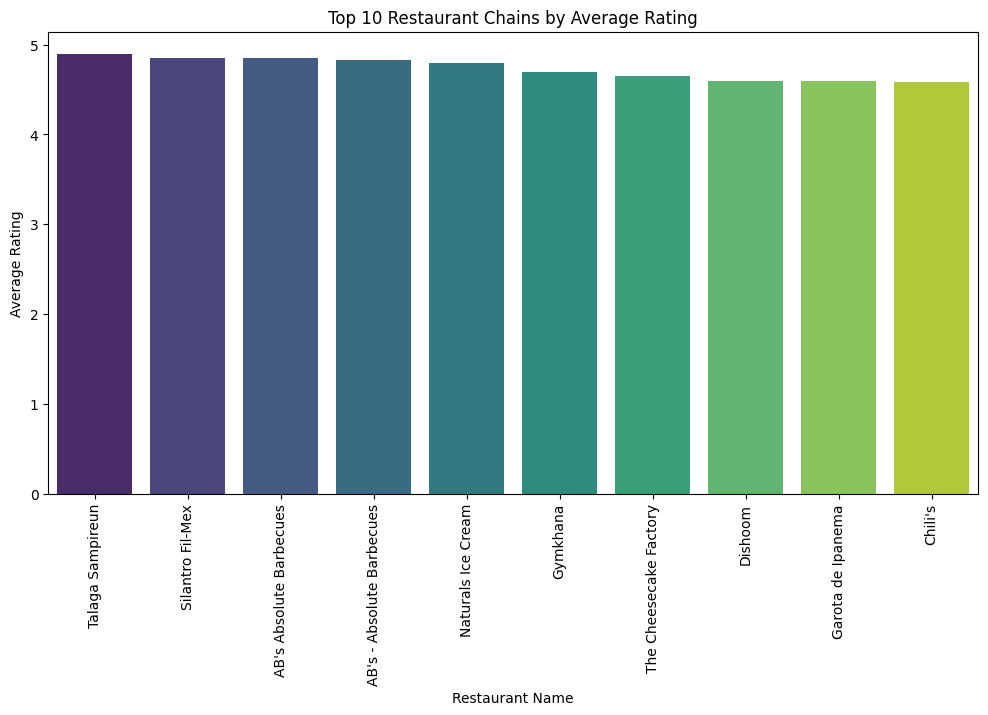

In [22]:
# Plot 1: Bar plot showing average ratings for restaurant chains
plt.figure(figsize=(12, 6))
sns.barplot(data=chain_ratings_sorted_by_rating.head(10), x='Restaurant Name', y='average_rating', palette='viridis')
plt.title('Top 10 Restaurant Chains by Average Rating')
plt.xlabel('Restaurant Name')
plt.ylabel('Average Rating')
plt.xticks(rotation=90)
plt.show()



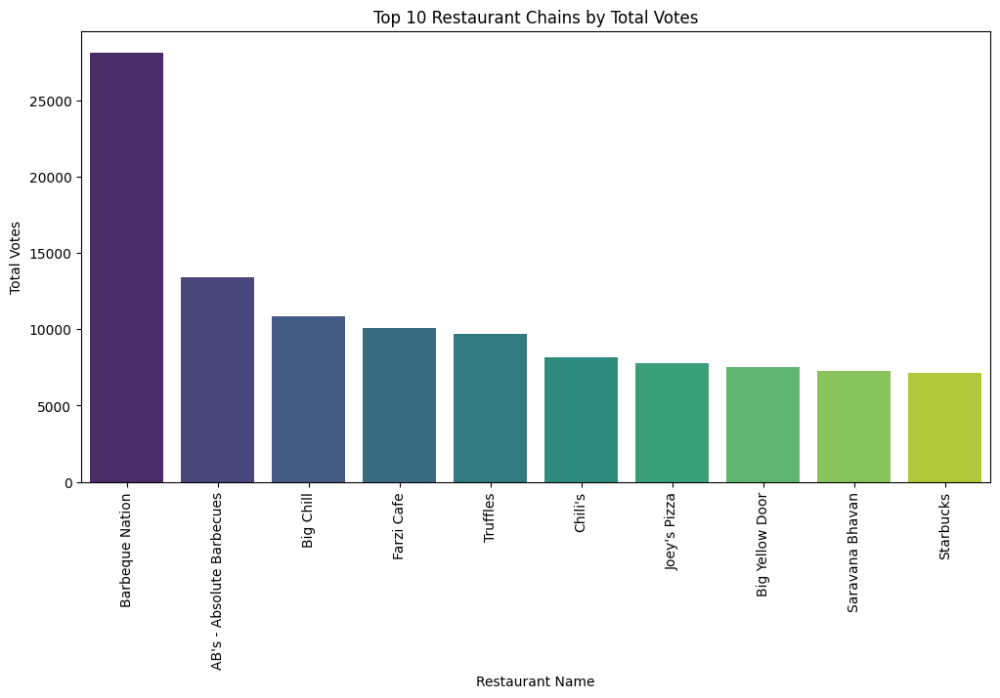

In [ ]:

# Plot 2: Bar plot showing total votes (popularity) for restaurant chains
plt.figure(figsize=(12, 6))
sns.barplot(data=chain_ratings_sorted_by_votes.head(10), x='Restaurant Name', y='total_votes', palette='viridis')
plt.title('Top 10 Restaurant Chains by Total Votes')
plt.xlabel('Restaurant Name')
plt.ylabel('Total Votes')
plt.xticks(rotation=90)
plt.show()



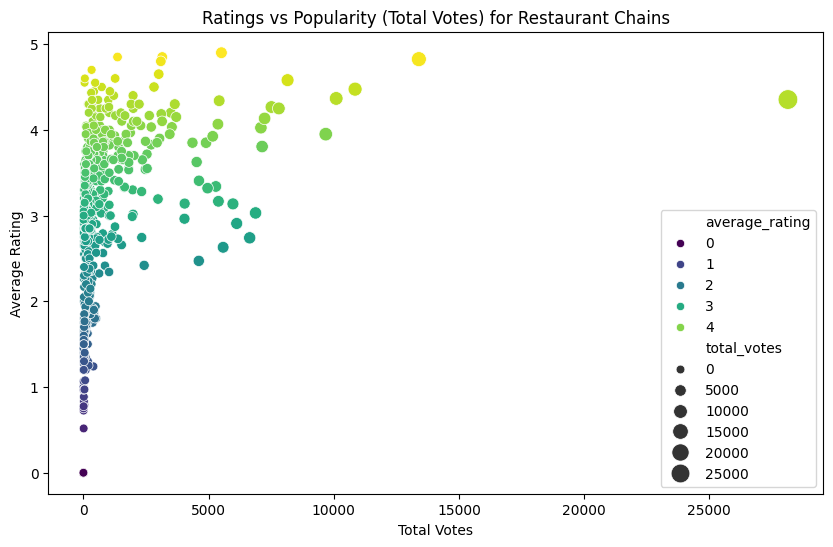

In [24]:
#  a scatter plot to show the correlation between average rating and total votes
plt.figure(figsize=(10, 6))
sns.scatterplot(data=chain_ratings, x='total_votes', y='average_rating', hue='average_rating', palette='viridis', size='total_votes', sizes=(40, 200))
plt.title('Ratings vs Popularity (Total Votes) for Restaurant Chains')
plt.xlabel('Total Votes')
plt.ylabel('Average Rating')
plt.show()